# Tp 1

In [1]:
import cv2
import matplotlib.pyplot as plt
import os
from IPython.display import Image
import numpy as np
from skimage.segmentation import mark_boundaries

In [2]:
images_path = "/kaggle/input/tp1-uqac-vision/Images"

In [3]:
for dirname, _, filenames in os.walk(f'{images_path}'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6571.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6567.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6568.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6572.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6569.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6573.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/Reference.JPG
/kaggle/input/tp1-uqac-vision/Images/Chambre/IMG_6570.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6557.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6552.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6551.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6559.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6560.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6558.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6554.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6556.JPG
/kaggle/input/tp1-uqac-vision/Images/Salon/Reference.JPG
/kaggle/input/tp1-uqac-vision/

Quelques notes :

- detecter les objets qui sont sur le plancer (++++ important)
- trouver le moyen de pouvoir deja delimiter la zone de plancher (soit un mask de plancher ou un mask de mur--puis inverse = plancer) - sinon faire une segmentation de region en prenant en compte les couleurs (plancher-tapis)
- ***peut etre focus sur le centre ??? puis operations mathematique pour delimiter
- ou plutot detection de concour ?-- en supposant que le sol sera la plus grande bounding box (car plus grande surface)
- ou tout simplement negliger
- countour puis bounding rectangle

Indications:
- previligier les methodes adaptatives et eviter le methode parametrable
- on peut presumer que pour une image x dans notre exemple , on a une forte probabilite que la zone du sol soit centre en bas (avec cette information possible de faire un decoupage de region probale afin d'ameliorer la creation du mask)

Experimentations:
- clahe tres bon pour uniformiser les images
- clahe + sobel = interessant performance
- sobel + threshold adaptatif= interessant pour notre cas (generalisable = appliquer sobel puis thresholding)

Les etapes :
1. Detecter la zone de sol
2. Detecter les changements (nouveaux objets)
3. si sur le sol -> danger a signaler
4. aller plus loin -> detecter la position de l'ojet
   

Dectections de regions:
- plus la region est pararrele au vertical ++ un mur sinon le sol

In [4]:
def show_image_wb(image_gray,title = "Image gray"):
    plt.imshow(image_gray , cmap='gray')
    plt.title(title)
    plt.show()

In [5]:
def show_image_rgb(image_bgr,title = "Image color"):
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.title(title)
    plt.show()

In [6]:
def show_hist(img, bins=256):
    """
    Shows histogram of an image. 
    'bins' controls the resolution. Lowering it increases bin width.
    """
    canal = img.shape[2] if len(img.shape) == 3 else 1
    
    if canal == 1:
        # Changed [256] to [bins]
        hist = cv2.calcHist([img], [0], None, [bins], [0, 256])
        plt.plot(hist)
        plt.title(f"Histogramme (Bins: {bins})")
    else:
        img_channels = cv2.split(img)
        colors = ('b', 'g', 'r')
        for i, col in enumerate(colors):
            # Changed [256] to [bins]
            histr = cv2.calcHist([img], [i], None, [bins], [0, 256])
            plt.plot(histr, color=col)
            plt.title(f"Histogramme Color (Bins: {bins})")
            
    plt.xlim([0, bins]) # Adjusted x-axis to match bin count
    plt.show()

In [7]:
def show_hist(img, bins=256):
    canal = img.shape[2] if len(img.shape) == 3 else 1
    
    # Create x-axis indices (0, 1, 2... up to bins-1)
    x = np.arange(bins)

    if canal == 1:
        hist = cv2.calcHist([img], [0], None, [bins], [0, 256])
        # flatten() turns the 2D array from OpenCV into a 1D array for plotting
        plt.bar(x, hist.flatten(), width=1.0, color='gray')
        plt.title(f"Histogramme (Bins: {bins})")
    else:
        colors = ('b', 'g', 'r')
        for i, col in enumerate(colors):
            histr = cv2.calcHist([img], [i], None, [bins], [0, 256])
            # Use alpha to see overlapping bars, or use plt.step for a cleaner look
            plt.bar(x, histr.flatten(), width=1.0, color=col, alpha=0.5)
            plt.title(f"Histogramme Color (Bins: {bins})")
            
    plt.xlim([0, bins])
    plt.show()

use blur technique to reduce non uniform lighting

In [24]:
ref_image = cv2.imread(f"/kaggle/input/tp1-uqac-vision/Images/Salon/Reference.JPG")

In [25]:
ref_image.shape

(4000, 6000, 3)

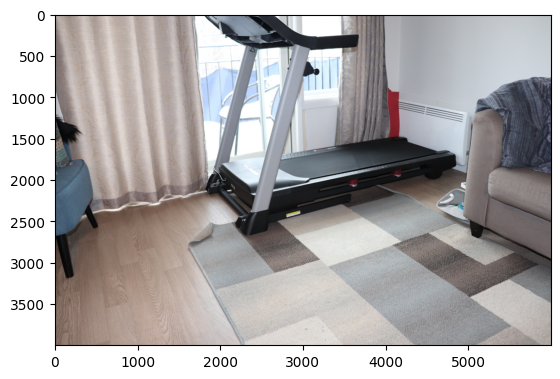

In [26]:
show_image_rgb(ref_image)

In [7]:
scale = 0.25

In [28]:
ref_image = cv2.resize(ref_image,None,fx=scale,fy=scale,interpolation=cv2.INTER_AREA) 

In [29]:
ref_image.shape

(1000, 1500, 3)

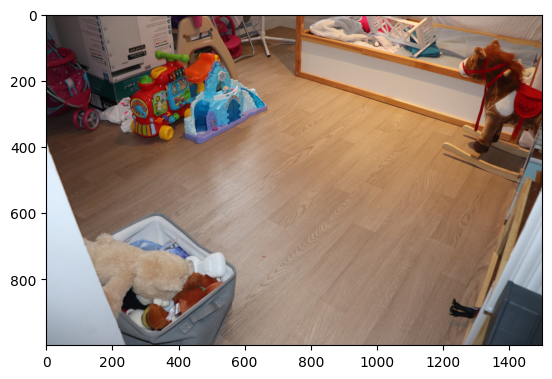

In [16]:
show_image_rgb(ref_image)

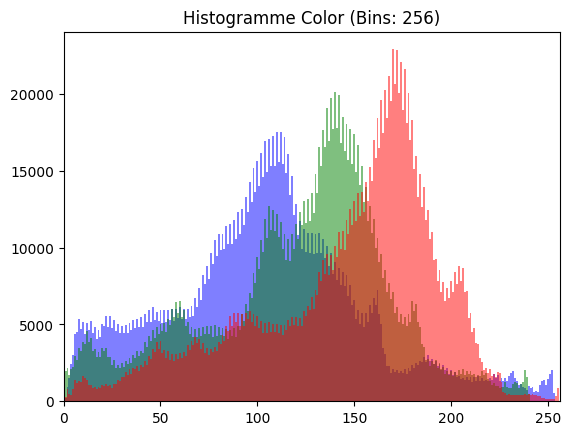

In [17]:
show_hist(ref_image)

In [18]:
def clahe_brg(image_bgr, clip_limit=6.0, tile_grid_size=(16, 16)):
    # Ensure uint8
    if image_bgr.dtype != np.uint8:
        print("hi")
        image_bgr = np.clip(image_bgr, 0, 255).astype(np.uint8)

    lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(
        clipLimit=clip_limit,
        tileGridSize=tile_grid_size
    )
    l_clahe = clahe.apply(l)

    lab_clahe = cv2.merge((l_clahe, a, b))
    return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)


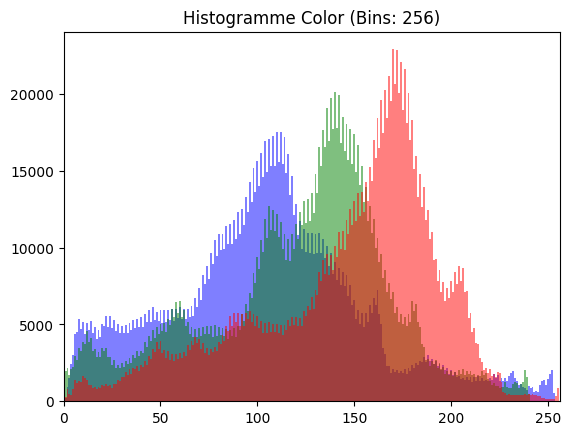

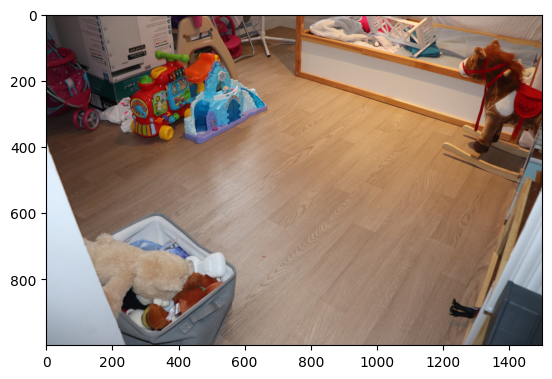

In [19]:
show_hist(ref_image)
show_image_rgb(ref_image)

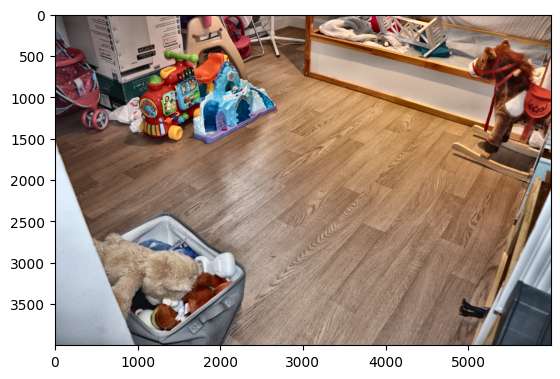

In [13]:
enhanced_img = clahe_brg(ref_image,2)
show_image_rgb(enhanced_img)

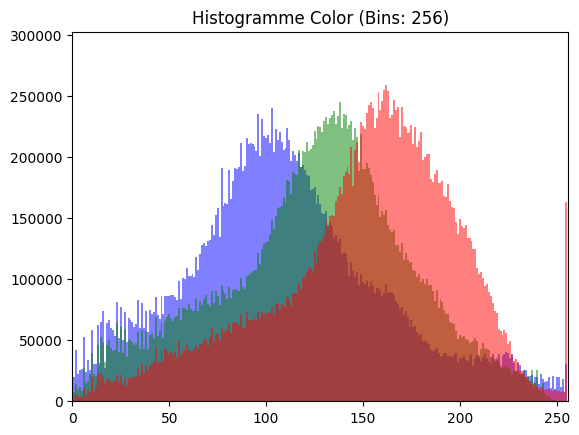

In [14]:
show_hist(enhanced_img)

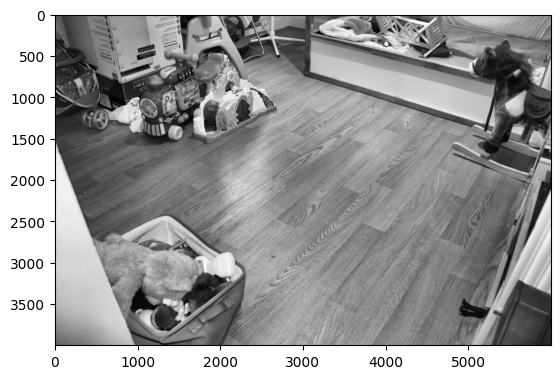

In [19]:
gray = cv2.cvtColor(ref_image, cv2.COLOR_BGR2GRAY)
gray_blur = cv2.GaussianBlur(gray, (5, 5), 0)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
gray = clahe.apply(gray_blur)
show_image_wb(gray)

In [39]:
kernel = np.ones((3, 3), np.uint8)

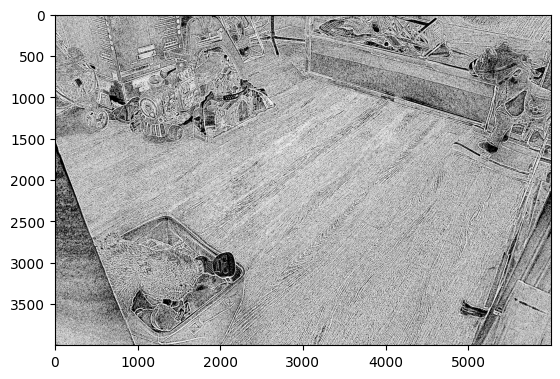

In [46]:
mask = cv2.adaptiveThreshold(
        gray,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        11,
        2
    )
# kernel = np.ones((3, 3), np.uint8)
# mask = cv2.morphologyEx(mask, cv2.MORPH_ERODE, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_DILATE, kernel,iterations=1)
# mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
# mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
show_image_wb(mask)

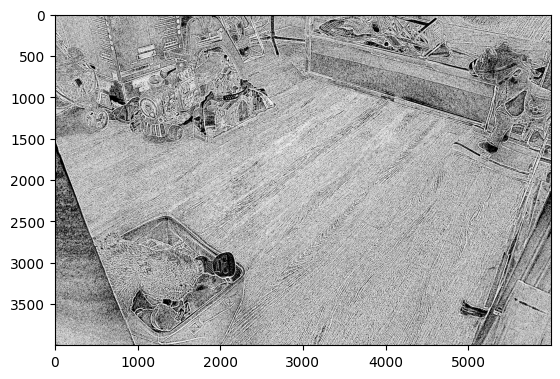

In [32]:
inverted_mask = cv2.bitwise_not(mask)
show_image_wb(inverted_mask)

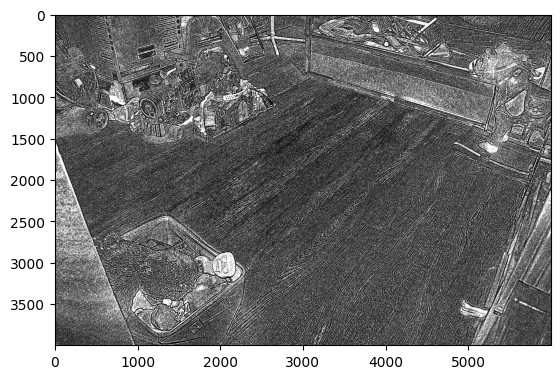

In [31]:
show_image_wb(mask)

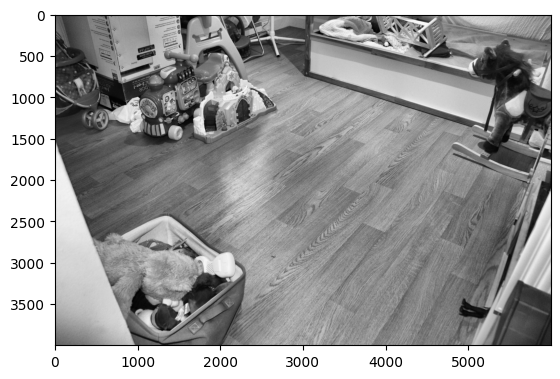

In [47]:
gray = cv2.cvtColor(ref_image, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
image_gray = clahe.apply(gray)
show_image_wb(image_gray)

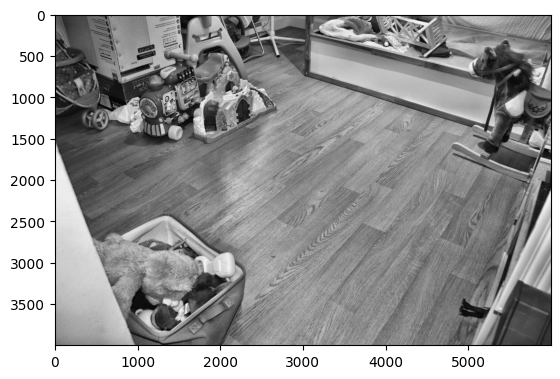

In [92]:
image_gray = cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2GRAY)
# image_gray = cv2.equalizeHist(image_gray)
show_image_wb(image_gray)

In [208]:
np.max(image_gray)

np.uint8(255)

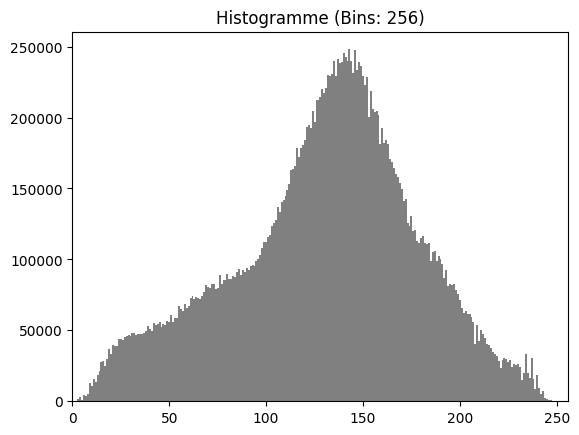

In [93]:
show_hist(image_gray,256)

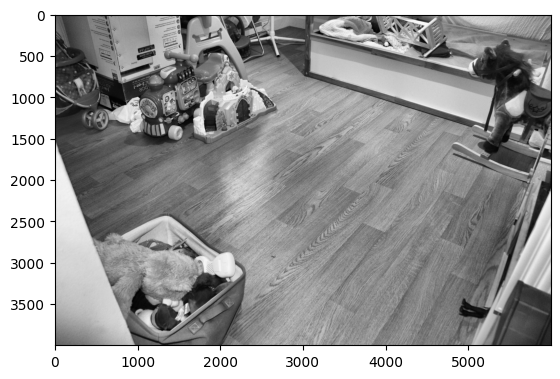

In [50]:
show_image_wb(image_gray)

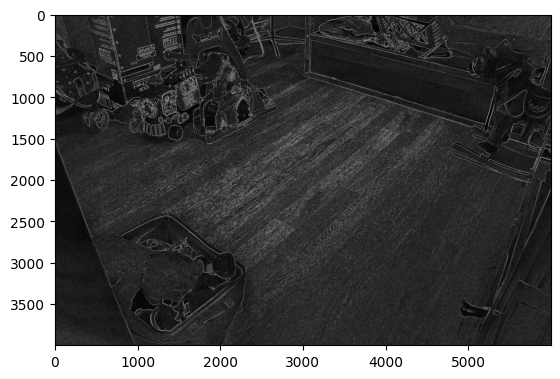

In [94]:
Sx = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, dst=None, ksize=3, scale=None, delta=None, borderType=cv2.BORDER_DEFAULT)
Sy = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, dst=None, ksize=3, scale=None, delta=None, borderType=cv2.BORDER_DEFAULT)
magnitude = np.sqrt(Sx**2 + Sy**2)
magnitude = np.uint8(magnitude)
# magnitude = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
show_image_wb(magnitude)

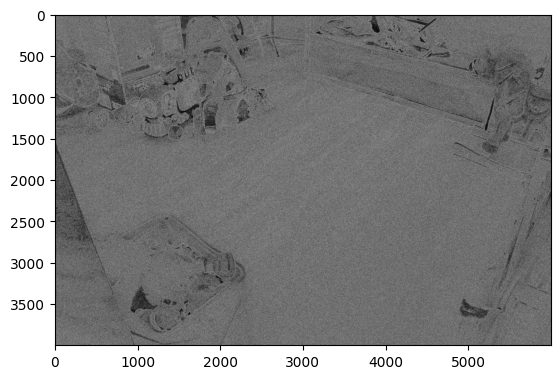

In [98]:
im = cv2.Laplacian(image_gray, cv2.CV_64F, dst=None, ksize=5, scale=None, delta=None, borderType=None) 
im = np.absolute(im)
im = np.uint8(im)
show_image_wb(im)

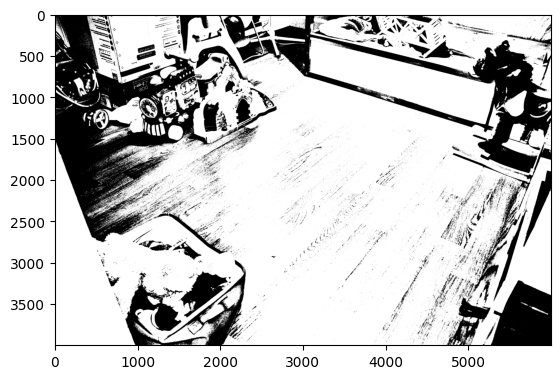

In [99]:
retval, dst = cv2.threshold(image_gray, 100, 250, cv2.THRESH_BINARY)
show_image_wb(dst)


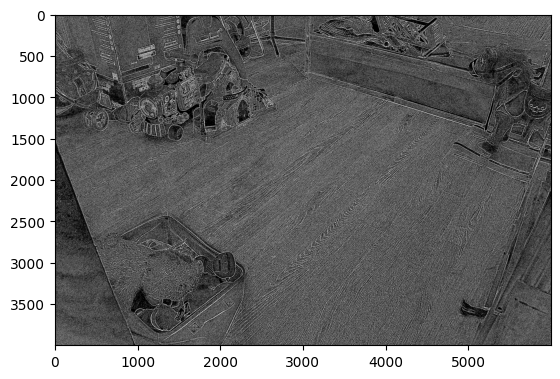

In [102]:
im_tres_adapt = cv2.adaptiveThreshold(image_gray, 1, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 7, 3)
show_image_wb(im_tres_adapt)

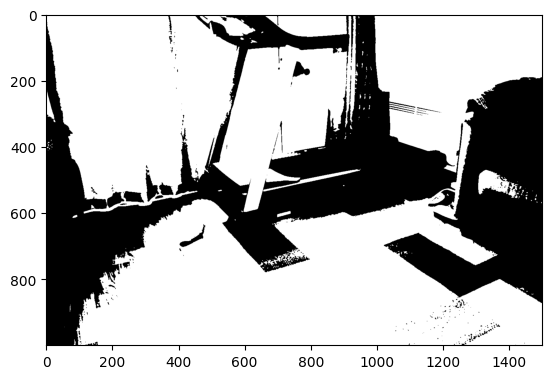

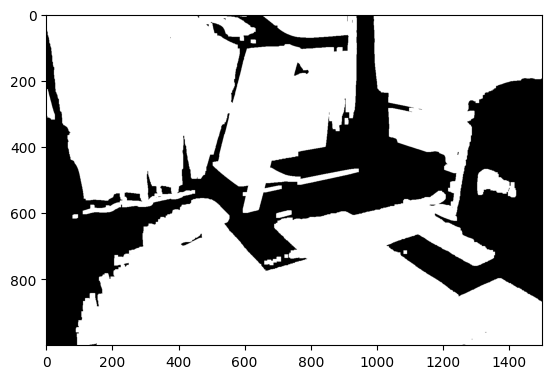

In [31]:
# thresh_val, thresh_img_otsu = cv2.threshold(image_gray, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
gray = cv2.cvtColor(ref_image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
_, binary = cv2.threshold(
    blur, 0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
sure_bg = cv2.dilate(opening, kernel, iterations=3)
show_image_wb(binary)
show_image_wb(sure_bg)

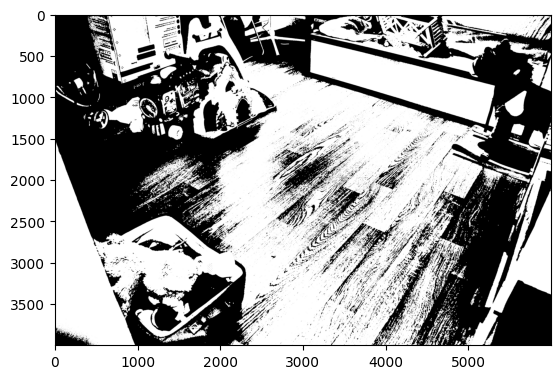

In [85]:
thresh_val, thresh_img = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)
show_image_wb(thresh_img)

In [93]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

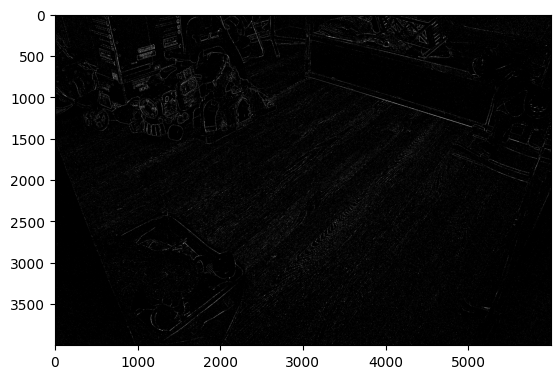

In [103]:
morpho = cv2.erode(im_tres_adapt, kernel, iterations=None) 
show_image_wb(morpho)

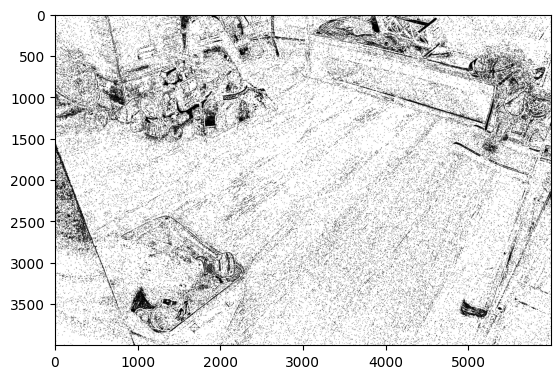

In [111]:
morpho = cv2.dilate(im_tres_adapt, kernel, iterations=None) 
morpho = cv2.erode(morpho, kernel, iterations=None) 
morpho = cv2.dilate(im_tres_adapt, kernel, iterations=2) 
morpho = cv2.erode(morpho, kernel, iterations=None) 
morpho = cv2.erode(morpho, kernel, iterations=None) 
show_image_wb(morpho)

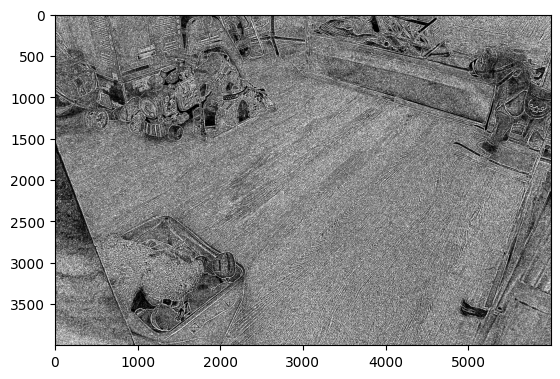

In [105]:
morpho = cv2.morphologyEx(im_tres_adapt, cv2.MORPH_CLOSE, kernel, iterations=None)
show_image_wb(morpho)

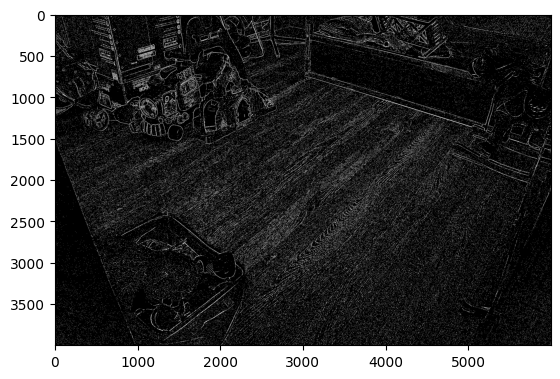

In [106]:
morpho = cv2.morphologyEx(im_tres_adapt, cv2.MORPH_OPEN, kernel , iterations = 1)
show_image_wb(morpho)

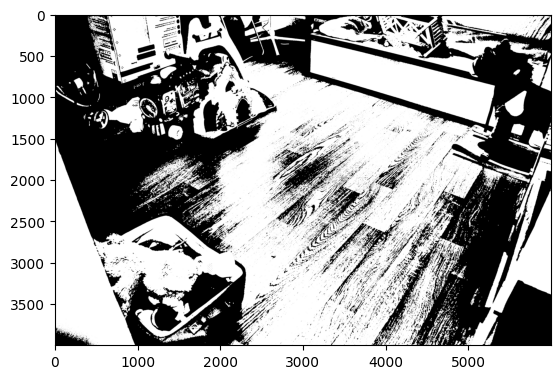

In [69]:
img_morph = cv2.erode(thresh_img_otsu, kernel, iterations=1) # separate   
img_morph = cv2.morphologyEx(img_morph, cv2.MORPH_OPEN, kernel)  
img_morph = cv2.morphologyEx(img_morph, cv2.MORPH_CLOSE, kernel) 
img_morph = cv2.dilate(img_morph, kernel, 1)                # restore size

show_image_wb(img_morph)

In [70]:
contours, hierarchy = cv2.findContours(img_morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE, None, None, None)

In [71]:
im = img_morph.copy()

In [73]:
ground = max(contours, key=cv2.contourArea)

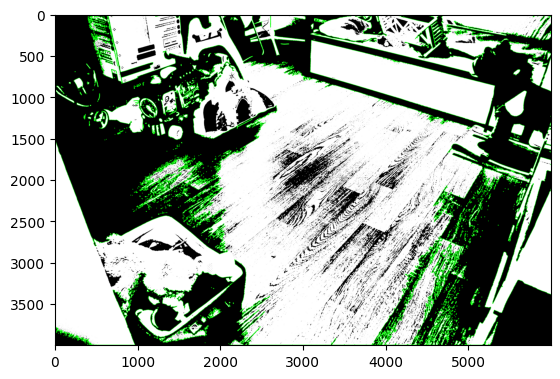

In [74]:
vis = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)

cv2.drawContours(
    vis,
    contours,
    -1,
    (0, 255, 0),   # bright green
    3              # thickness
)
show_image_rgb(vis)

# Try superpixelisation

In [21]:
image = ref_image.copy()

In [22]:
lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)

l_flat = np.full_like(l, 128)   # constant lightness

lab_flat = cv2.merge((l_flat, a, b))
image_flat = cv2.cvtColor(lab_flat, cv2.COLOR_LAB2BGR)

In [119]:
lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)

l_norm = cv2.normalize(l, None, alpha=128, beta=128, norm_type=cv2.NORM_MINMAX)

lab_norm = cv2.merge((l_norm, a, b))
image_norm = cv2.cvtColor(lab_norm, cv2.COLOR_LAB2BGR)

In [168]:
slic = cv2.ximgproc.createSuperpixelSLIC(image_flat, algorithm=cv2.ximgproc.SLIC, region_size=300, ruler=60.0)
slic.iterate(10)

In [169]:
labels = slic.getLabels()         # The Label Matrix (ID for each pixel)
mask = slic.getLabelContourMask() # The Boundary Map

In [170]:
boundary_img = mark_boundaries(image, labels)

# 4. Create the "Mosaic" (Average Color) view
mosaic = np.zeros_like(image)

In [173]:
slic.getNumberOfSuperpixels()

260

In [174]:
for i in range(slic.getNumberOfSuperpixels()):
    mask = (labels == i)
    mosaic[mask] = cv2.mean(image, mask.astype(np.uint8))[:3]

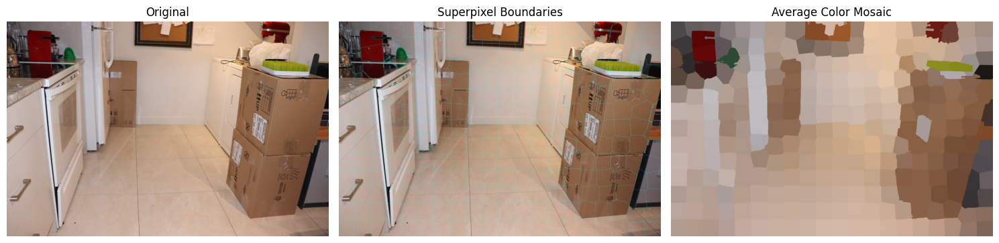

In [175]:
# 5. Display with Matplotlib
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax[0].set_title("Original")

boundary_img_uint8 = (boundary_img * 255).astype(np.uint8)
ax[1].imshow(cv2.cvtColor(boundary_img_uint8, cv2.COLOR_BGR2RGB))
ax[1].set_title("Superpixel Boundaries")

ax[2].imshow(cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB))
ax[2].set_title("Average Color Mosaic")

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

# Watersheed

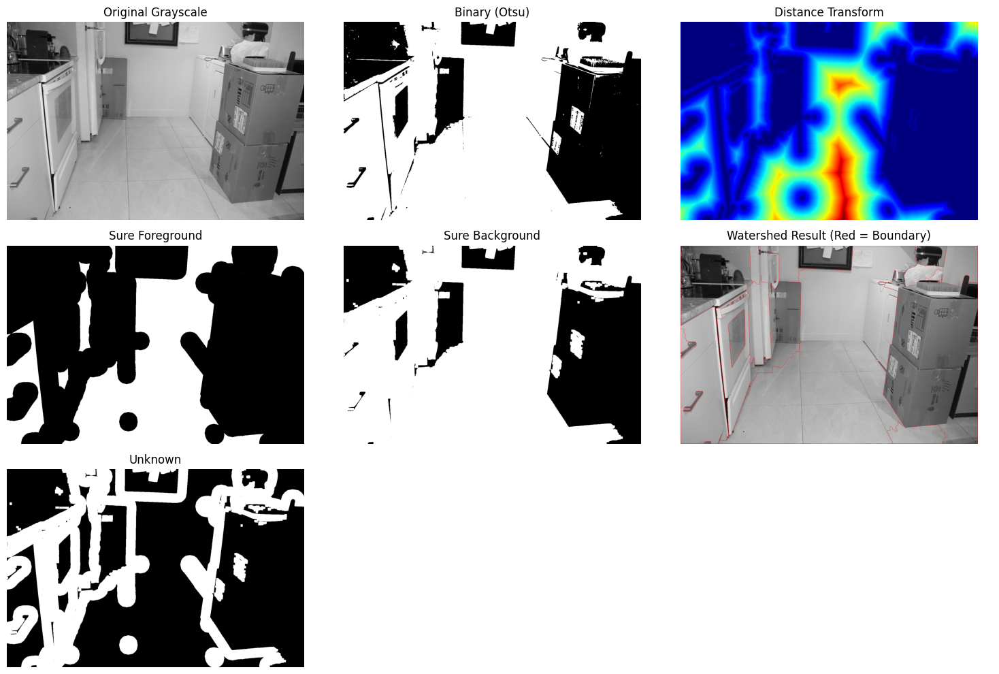

In [20]:
im_ws = cv2.imread('/kaggle/input/tp1-uqac-vision/Images/Cuisine/Reference.JPG')
im_ws = cv2.resize(im_ws,None,fx=scale,fy=scale,interpolation=cv2.INTER_AREA) 

# -----------------------------
# 1. Read grayscale image
# -----------------------------
# img = cv2.imread("image.png", cv2.IMREAD_GRAYSCALE)
img = cv2.cvtColor(im_ws, cv2.COLOR_BGR2GRAY)
assert img is not None, "Image not found!"

# -----------------------------
# 2. Noise removal
# -----------------------------
blur = cv2.GaussianBlur(img, (5, 5), 0)

# -----------------------------
# 3. Threshold (Otsu)
# -----------------------------
_, binary = cv2.threshold(
    blur, 0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# -----------------------------
# 4. Morphological opening
# -----------------------------
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

# -----------------------------
# 5. Sure background
# -----------------------------
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# -----------------------------
# 6. Distance transform → foreground
# -----------------------------
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(
    dist_transform,
    0.2 * dist_transform.max(),
    255,
    0
)
sure_fg = np.uint8(sure_fg)

# -----------------------------
# 7. Unknown region
# -----------------------------
unknown = cv2.subtract(sure_bg, sure_fg)

# -----------------------------
# 8. Marker labeling
# -----------------------------
_, markers = cv2.connectedComponents(sure_fg)
markers += 1
markers[unknown == 255] = 0

# -----------------------------
# 9. Apply watershed
# -----------------------------
img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
markers = cv2.watershed(img_color, markers)

# -----------------------------
# 10. Visualize results
# -----------------------------
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.ravel()

axes[0].imshow(img, cmap="gray")
axes[0].set_title("Original Grayscale")

axes[1].imshow(binary, cmap="gray")
axes[1].set_title("Binary (Otsu)")

axes[2].imshow(dist_transform, cmap="jet")
axes[2].set_title("Distance Transform")

axes[3].imshow(sure_fg, cmap="gray")
axes[3].set_title("Sure Foreground")

axes[4].imshow(sure_bg, cmap="gray")
axes[4].set_title("Sure Background")

# Mark watershed boundaries in red
result = img_color.copy()
result[markers == -1] = [255, 0, 0]

axes[5].imshow(result)
axes[5].set_title("Watershed Result (Red = Boundary)")

axes[6].imshow(unknown, cmap="gray")
axes[6].set_title("Unknown")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [19]:
unknown

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

# SLIC total

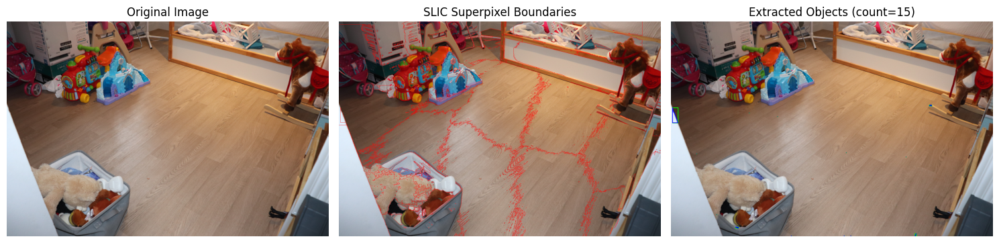

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------------
# 1. Read image
# ----------------------------------
# image = cv2.imread("image.png")
image = ref_image
# assert image is not None, "Image not found!"

image_flat = ref_image.copy()

# ----------------------------------
# 2. Run SLIC
# ----------------------------------
slic = cv2.ximgproc.createSuperpixelSLIC(
    image_flat,
    algorithm=cv2.ximgproc.SLIC,
    region_size=300,
    ruler=60.0
)

slic.iterate(10)

labels = slic.getLabels()                 # (H, W)
mask = slic.getLabelContourMask()         # boundaries
num_labels = slic.getNumberOfSuperpixels()

# ----------------------------------
# 3. Visualize superpixel boundaries
# ----------------------------------
boundary_vis = image.copy()
boundary_vis[mask == 255] = [0, 0, 255]

# ----------------------------------
# 4. Object extraction from superpixels
# ----------------------------------
objects = []
min_area = 500     # tune this threshold

H, W = labels.shape

for sp_id in range(num_labels):
    sp_mask = (labels == sp_id).astype("uint8") * 255
    area = cv2.countNonZero(sp_mask)

    if area < min_area:
        continue

    # Find contour
    contours, _ = cv2.findContours(
        sp_mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    if not contours:
        continue

    cnt = contours[0]
    x, y, w, h = cv2.boundingRect(cnt)

    objects.append({
        "id": sp_id,
        "area": area,
        "mask": sp_mask,
        "contour": cnt,
        "bbox": (x, y, w, h)
    })

# ----------------------------------
# 5. Draw extracted objects
# ----------------------------------
object_vis = image.copy()

for obj in objects:
    x, y, w, h = obj["bbox"]
    cv2.rectangle(object_vis, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.drawContours(object_vis, [obj["contour"]], -1, (255, 0, 0), 2)

# ----------------------------------
# 6. Show results
# ----------------------------------
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(boundary_vis, cv2.COLOR_BGR2RGB))
plt.title("SLIC Superpixel Boundaries")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(object_vis, cv2.COLOR_BGR2RGB))
plt.title(f"Extracted Objects (count={len(objects)})")
plt.axis("off")

plt.tight_layout()
plt.show()

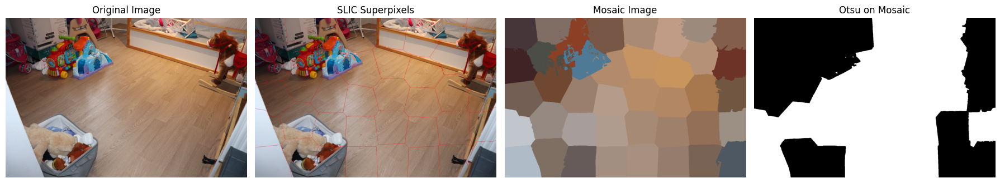

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# If your image is grayscale, convert to BGR for SLIC
if len(image.shape) == 2:
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

# image_flat = image.copy()

# ----------------------------------
# 2. Run SLIC
# ----------------------------------
slic = cv2.ximgproc.createSuperpixelSLIC(
    image_flat,
    algorithm=cv2.ximgproc.SLIC,
    region_size=200,
    ruler=100.0
)
slic.iterate(10)

labels = slic.getLabels()
num_labels = slic.getNumberOfSuperpixels()
mask = slic.getLabelContourMask()

# ----------------------------------
# 3. Create mosaic image
# ----------------------------------
mosaic = np.zeros_like(image, dtype=np.uint8)

for sp_id in range(num_labels):
    sp_mask = (labels == sp_id)

    if not np.any(sp_mask):
        continue

    mean_color = image[sp_mask].mean(axis=0)
    mosaic[sp_mask] = mean_color.astype(np.uint8)

# ----------------------------------
# 4. Convert mosaic to grayscale
# ----------------------------------
gray_mosaic = cv2.cvtColor(mosaic, cv2.COLOR_BGR2GRAY)

# ----------------------------------
# 5. Otsu threshold on mosaic
# ----------------------------------
_, otsu_mask = cv2.threshold(
    gray_mosaic,
    0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# ----------------------------------
# 6. Clean up (optional but recommended)
# ----------------------------------
kernel = np.ones((3, 3), np.uint8)
otsu_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_OPEN, kernel, iterations=2)
otsu_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

# ----------------------------------
# 7. Visualization
# ----------------------------------
boundary_vis = image.copy()
boundary_vis[mask == 255] = [0, 0, 255]

plt.figure(figsize=(18, 6))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(cv2.cvtColor(boundary_vis, cv2.COLOR_BGR2RGB))
plt.title("SLIC Superpixels")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB))
plt.title("Mosaic Image")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(otsu_mask, cmap="gray")
plt.title("Otsu on Mosaic")
plt.axis("off")

plt.tight_layout()
plt.show()


# SLIC + Mosaic + otsu

In [62]:
im_2 = cv2.imread('/kaggle/input/tp1-uqac-vision/Images/Salon/IMG_6558.JPG')
im_2 = cv2.resize(im_2,None,fx=scale,fy=scale,interpolation=cv2.INTER_AREA) 

In [111]:
def preprocess_image(ref_image):
    # gray = cv2.cvtColor(ref_image, cv2.COLOR_BGR2GRAY)
    # blur = cv2.GaussianBlur(gray, (5, 5), 0)

    _, binary = cv2.threshold(
        blur, 0, 255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    show_image_wb(binary)
    show_image_wb(sure_bg)

In [108]:
def show_otsu_image(ref_image):
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    _, binary = cv2.threshold(
        blur, 0, 255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    show_image_wb(binary)
    show_image_wb(sure_bg)

In [63]:
lab = cv2.cvtColor(im_2, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)

l_flat = np.full_like(l, 128)   # constant lightness

lab_flat = cv2.merge((l_flat, a, b))
image_flat = cv2.cvtColor(lab_flat, cv2.COLOR_LAB2BGR)

In [64]:
slic = cv2.ximgproc.createSuperpixelSLIC(image_flat, algorithm=cv2.ximgproc.SLIC, region_size=80, ruler=20.0)
slic.iterate(10)

In [65]:
labels = slic.getLabels()         # The Label Matrix (ID for each pixel)
mask = slic.getLabelContourMask() # The Boundary Map

In [66]:
boundary_img = mark_boundaries(im_2, labels)

# 4. Create the "Mosaic" (Average Color) view
mosaic = np.zeros_like(im_2)

In [67]:
for i in range(slic.getNumberOfSuperpixels()):
    mask = (labels == i)
    mosaic[mask] = cv2.mean(im_2, mask.astype(np.uint8))[:3]

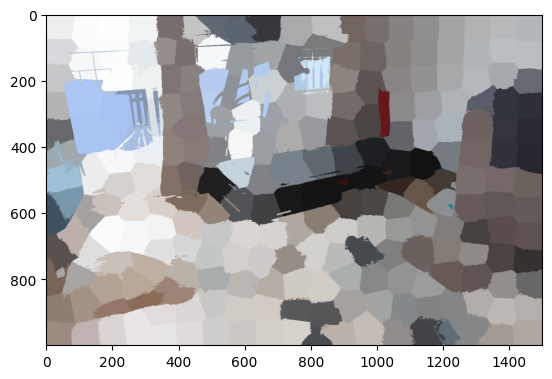

In [68]:
show_image_rgb(mosaic)

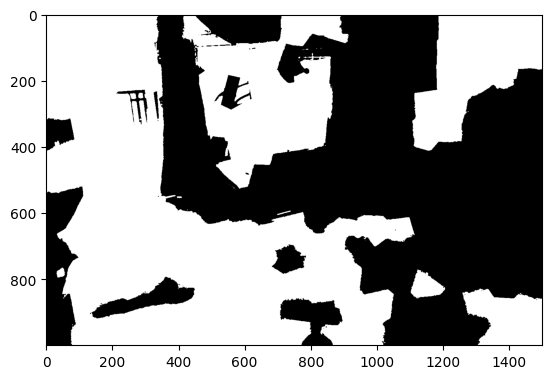

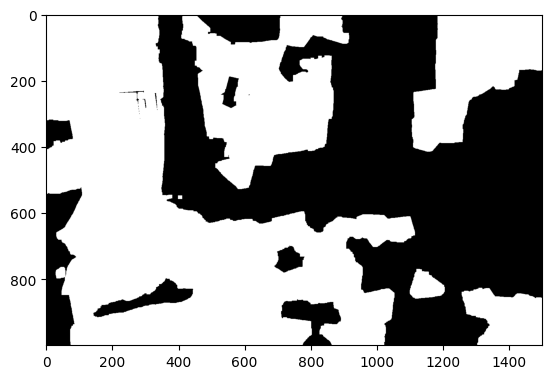

In [69]:
preprocess_image(mosaic)

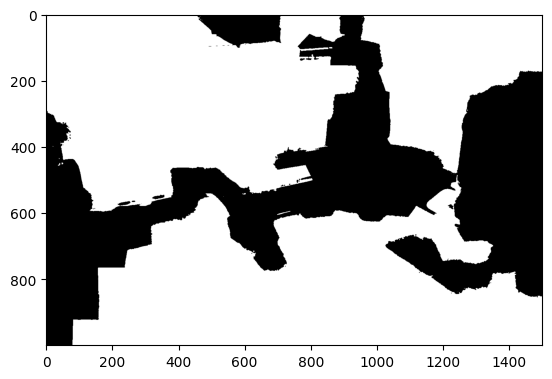

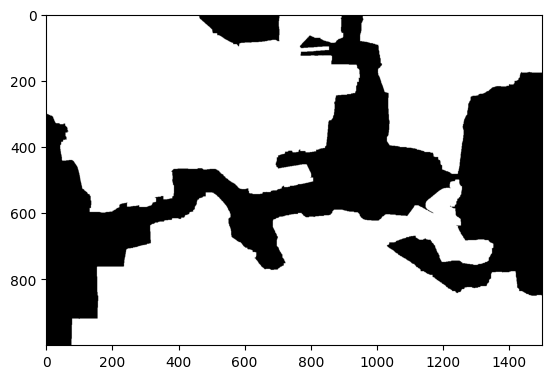

In [59]:
preprocess_image(mosaic)

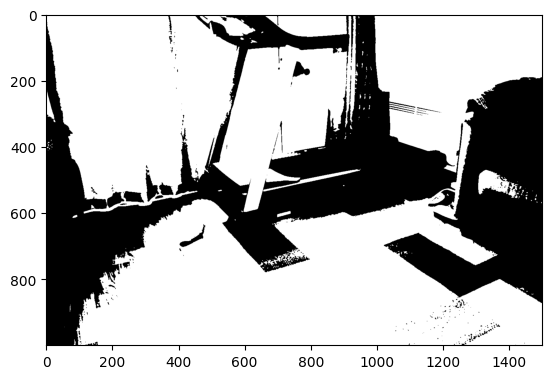

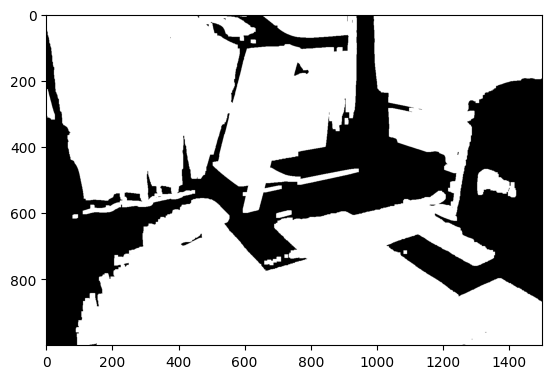

In [53]:
gray = cv2.cvtColor(ref_image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
_, binary = cv2.threshold(
    blur, 0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
sure_bg = cv2.dilate(opening, kernel, iterations=3)
show_image_wb(binary)
show_image_wb(sure_bg)

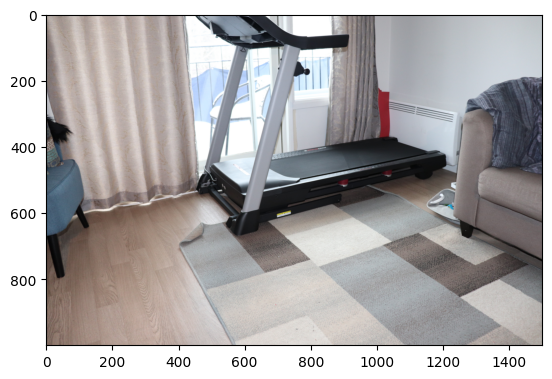

In [46]:
show_image_rgb(ref_image)

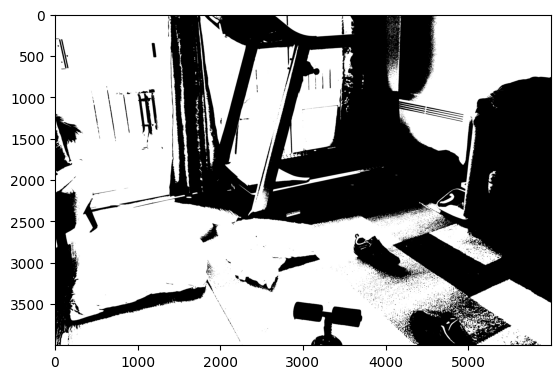

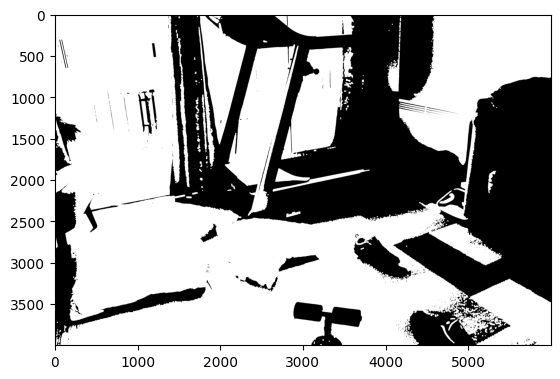

In [58]:
preprocess_image(im_2)

In [90]:
im3 =  ref_image - ref_image

In [91]:
imm4 = cv2.bitwise_xor(im_2,ref_image)

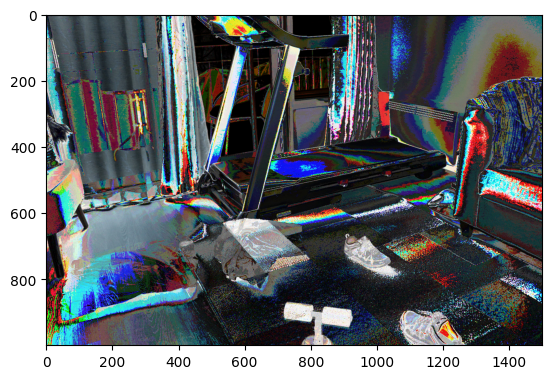

In [92]:
show_image_rgb(imm4)

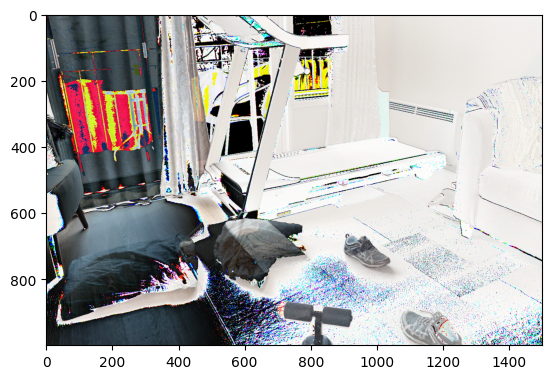

In [85]:
show_image_rgb(im3)

In [102]:
def preprocess_bgr(img):
    """
    Normalize lighting using LAB + CLAHE.
    Returns single-channel image suitable for absdiff.
    """
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)

    return l


def absdiff_lighting(img1_bgr, img2_bgr):
    p1 = preprocess_bgr(img1_bgr)
    p2 = preprocess_bgr(img2_bgr)

    diff = cv2.absdiff(p1, p2)
    return diff

In [104]:
diff = absdiff_lighting(ref_image , im_2)

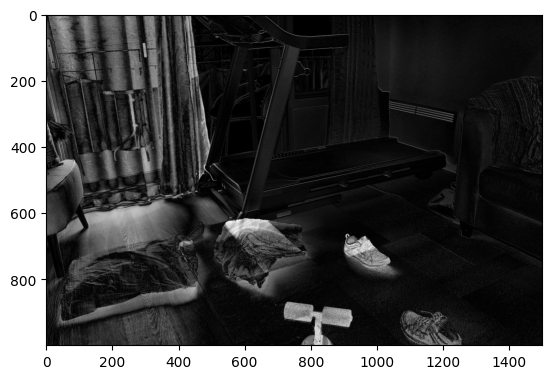

In [105]:
show_image_rgb(diff)

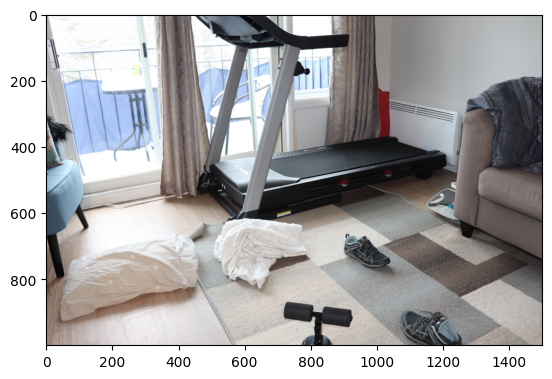

In [101]:
show_image_rgb(im_2)

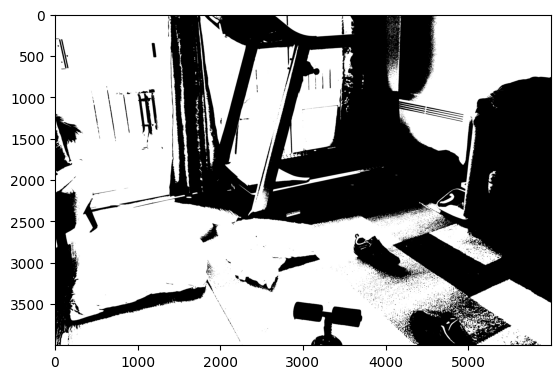

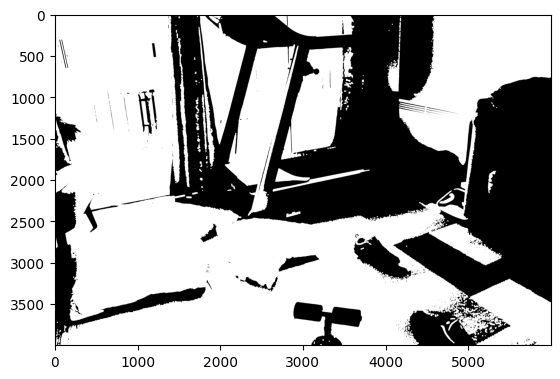

In [112]:
show_otsu_image(diff)

# Debut veritable du travail

Notre travail consiste a mettre en place un algo de detection d'objet dans une maison successible de causer une entrave a la mobilite des personne ages.
Terminoligie:
- zone a risque : represente la zone du sol surlequel notre personnage marcherait , autrement dit dans notre image de reference elle represente l'espace du sol non oqupe par des objets statiques
- objets entravant : tous les objets qui apparaissent sur la zone a risque (des objets qui n'existent pas dans l'image de reference).

Nous pouvont donc decouper notre travail de la sorte:
- la premiere partie consiste a creer un masque qui delimite la zone a risque
- la deuxieme partie la detection de nouveaux objets (puis/et le filtrage des ceux uniquement presents sur la zone à risque)
NB : avec cette methode , ces deux parties peuvent etre travaille de facon independante et en paraelle. De plus , il assure la scalabilite (on pourrait par exemple admettre l'existance du masque qui serait fourni ou preprocesse manuellement dans chaque piece)

## Detection de la zone de danger

Cette partie est essentiel et la plus deliquate. Comment peut-on a partir d'une image plate , detecter des regions ? des mur ? le sol ? un tapis ? etc...
Nous avons fait plusieurs experimentations , de la plus complexes (SLIC , Watersheed etc...) a la plus simple (binarisation classique) mais les methodes de binarisations sans trop de complexite en matiere de couleurs nous on permis d'approcher ce qui pourrait etre des masques plus ou moins fidels.

Concretement:
1. Imporation image de referenc en couleur
2. Scaling
3. Normalisation , equalisation etc... afin de reduire le bruit des lumieres sur nos images
4. Convertion de l'image en grayscale
5. Gaussian blur avec une filtre 5, 5
6. Binarisation avec filtre d'otsu\
7. Opening et dilate
8. Detection d'objet (contours)
9. Filtrer les contours avec une algorithme naif (parallelisme des ligne a la vertical = mur) donc pas sol

Notez que entre 3 et 4 , nous pouvons appliquer SLIC afin de reduire les bruits sur notre binarisation et ainsi eviter certains details unitils.
Nous traiterons ces deux cas dans les prochaines ligne

### 1 . 2 . 3 - importation , scalling etc...

In [8]:
scale = 0.25

In [9]:
image_de_reference = cv2.imread('/kaggle/input/tp1-uqac-vision/Images/Salon/Reference.JPG')
image_de_reference = cv2.resize(image_de_reference,None,fx=scale,fy=scale,interpolation=cv2.INTER_AREA) 

### SLIC

In [10]:
lab = cv2.cvtColor(image_de_reference, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)

l_flat = np.full_like(l, 128)   # constant lightness

lab_flat = cv2.merge((l_flat, a, b))
image_flat = cv2.cvtColor(lab_flat, cv2.COLOR_LAB2BGR)

In [11]:
slic = cv2.ximgproc.createSuperpixelSLIC(image_flat, algorithm=cv2.ximgproc.SLIC, region_size=20, ruler=10.0)
slic.iterate(10)

In [12]:
labels = slic.getLabels()         
mask = slic.getLabelContourMask() 

# boundary_img = mark_boundaries(im_2, labels)

mosaic = np.zeros_like(image_de_reference)

for i in range(slic.getNumberOfSuperpixels()):
    mask = (labels == i)
    mosaic[mask] = cv2.mean(image_de_reference, mask.astype(np.uint8))[:3]

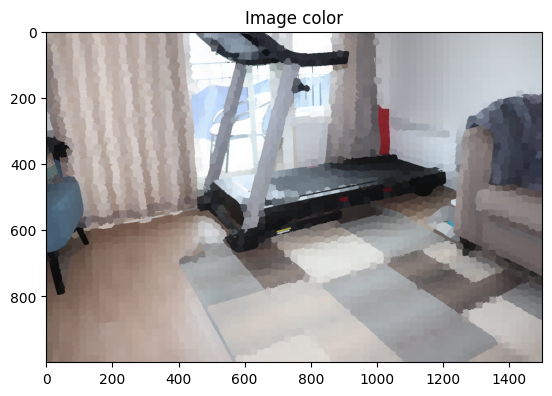

In [13]:
show_image_rgb(mosaic)

### 4. converstion en gray scale 

In [14]:
# image_de_reference_gray = cv2.cvtColor(image_de_reference, cv2.COLOR_BGR2GRAY)
image_de_reference_gray = cv2.cvtColor(mosaic, cv2.COLOR_BGR2GRAY)

### 5. Filtre gaussien 

In [15]:
blur = cv2.GaussianBlur(image_de_reference_gray, (5, 5), 0)

### 6. Binarisation otsu

In [16]:
_, binary = cv2.threshold(
    blur, 0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

### 7. Ouverture - dilatation

In [17]:
kernel = np.ones((3, 3), np.uint8)
kernel_4 = np.ones((4, 3), np.uint8)

opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=3)
sure_bg = cv2.dilate(opening, kernel, iterations=3)
sure_bg = cv2.erode(opening, kernel_4, iterations=8)

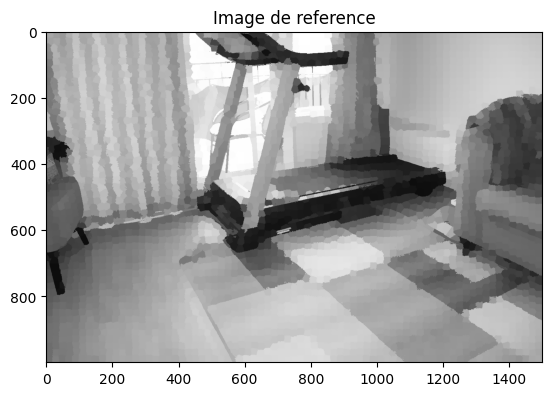

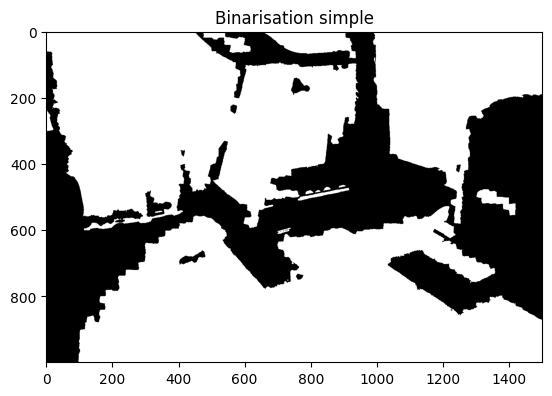

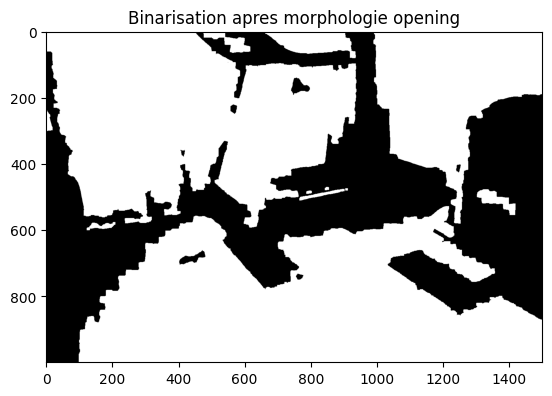

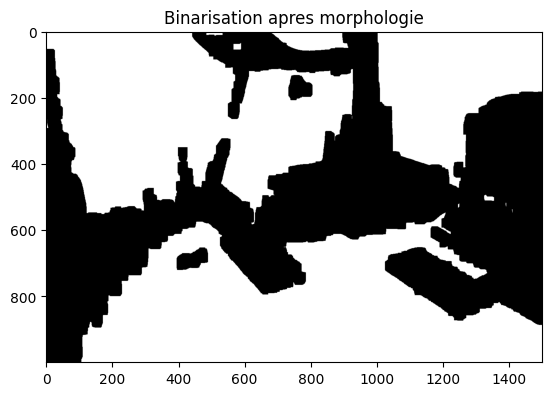

In [18]:
show_image_rgb(image_de_reference_gray,'Image de reference')
show_image_wb(binary,"Binarisation simple")
show_image_wb(opening,"Binarisation apres morphologie opening")
show_image_wb(sure_bg,"Binarisation apres morphologie")

### 8. Detection d'objet

In [19]:
contours, hierarchy = cv2.findContours(sure_bg, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE, None, None, None)

In [20]:
ground = max(contours, key=cv2.contourArea)

In [21]:
largest_4 = sorted(contours, key=cv2.contourArea, reverse=True)

In [22]:
len(largest_4)

12

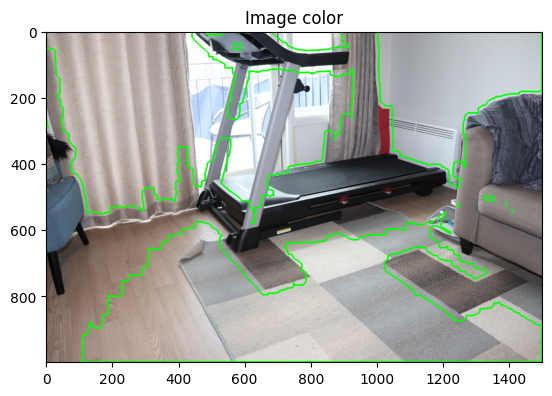

In [23]:
# vis = cv2.cvtColor(sure_bg, cv2.COLOR_GRAY2BGR)
# im_copy = image_de_reference.copy()
vis = image_de_reference.copy()
cv2.drawContours(
    vis,
    largest_4,
    -1,
    (0, 255, 0),   # bright green
    3              # thickness
)
show_image_rgb(vis)

In [24]:
# im_rec = image_de_reference.copy()
im_rec = cv2.cvtColor(sure_bg.copy(), cv2.COLOR_GRAY2BGR)
for contour in largest_4:
    # ignorer les petits contours si nécessaire
    if cv2.contourArea(contour) < 100:
        continue

    # rectangle de plus petite aire (incliné)
    rect = cv2.minAreaRect(contour)

    # récupérer les 4 coins
    box = cv2.boxPoints(rect)
    box = box.astype(int)

    # tracer le rectangle sur l'image
    cv2.drawContours(im_rec, [box], 0, (0, 255, 0), 2)

    # (optionnel) afficher centre, dimensions et angle
    (center, (w, h), angle) = rect
    if w < h:
        angle += 90

    if w < h:
        angle_corrige = angle + 90
    else:
        angle_corrige = angle
        
    epsilon = 5
    print("\n")
    if abs(angle_corrige) < epsilon:
        print("Rectangle horizontal (côté long parallèle à x-axis)")
    elif abs(angle_corrige - 90) < epsilon:
        print("Rectangle vertical (côté long parallèle à y-axis)")
    else:
        print(f"Rectangle incliné, angle ≈ {angle_corrige:.1f}°")



Rectangle horizontal (côté long parallèle à x-axis)


Rectangle horizontal (côté long parallèle à x-axis)


Rectangle incliné, angle ≈ 270.0°


Rectangle incliné, angle ≈ 270.0°


Rectangle incliné, angle ≈ 270.0°


Rectangle incliné, angle ≈ 270.0°


Rectangle horizontal (côté long parallèle à x-axis)


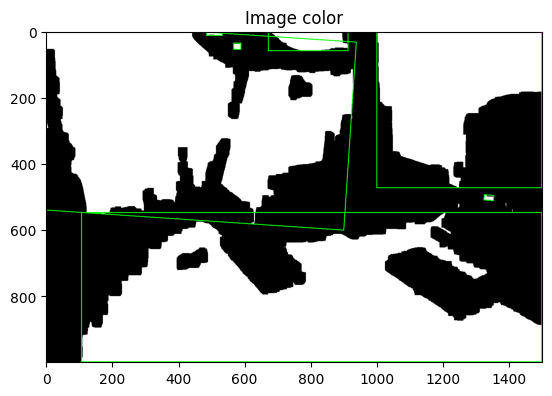

In [25]:
show_image_rgb(im_rec)

In [26]:
h, w = sure_bg.shape[:2]
image_area = h * w



Rectangle horizontal (côté long parallèle à x-axis)


Rectangle horizontal (côté long parallèle à x-axis)


Rectangle vertical (côté long parallèle à y-axis 2)


Rectangle vertical (côté long parallèle à y-axis 2)


Rectangle vertical (côté long parallèle à y-axis 2)


Rectangle vertical (côté long parallèle à y-axis 2)


Rectangle horizontal (côté long parallèle à x-axis)


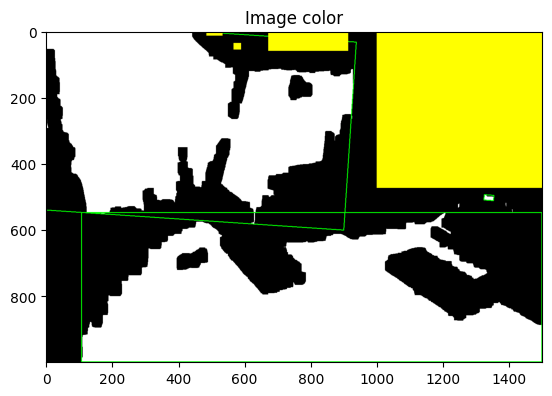

In [30]:
im_rec = cv2.cvtColor(sure_bg.copy(), cv2.COLOR_GRAY2BGR)

for contour in largest_4:
    if cv2.contourArea(contour) < 100:
        continue

    rect = cv2.minAreaRect(contour)
    box = cv2.boxPoints(rect)
    box = box.astype(int)

    (center, (w, h), angle) = rect

    # normalize angle so that long side is considered
    if w < h:
        angle += 90

    angle_corrige = angle

    epsilon = 40
    print("\n")

    if abs(angle_corrige) < epsilon:
        print("Rectangle horizontal (côté long parallèle à x-axis)")
        # draw only contour (green)
        cv2.drawContours(im_rec, [box], 0, (0, 255, 0), 2)

    elif abs(angle_corrige - 90) < epsilon:
        print("Rectangle vertical (côté long parallèle à y-axis)")
        # 👉 FILL region in yellow
        cv2.drawContours(im_rec, [box], 0, (0, 255, 255), -1)
        
    elif abs(angle_corrige - 180) < epsilon:
        print("Rectangle vertical (côté long parallèle à y-axis 2)")
        # 👉 FILL region in yellow
        if cv2.contourArea(contour) < image_area/2:
            cv2.drawContours(im_rec, [box], 0, (0, 255, 255), -1)
    else:
        print(f"Rectangle incliné, angle ≈ {angle_corrige:.1f}°")
        cv2.drawContours(im_rec, [box], 0, (0, 0, 255), 2)
        if cv2.contourArea(contour) < image_area/2:
            cv2.drawContours(im_rec, [box], 0, (255, 0, 0), -1)

show_image_rgb(im_rec)

In [40]:
mask = sure_bg.copy()

Rectangle horizontal (côté long parallèle à x-axis)
half top here :|
Rectangle horizontal (côté long parallèle à x-axis)
half top here :|
Rectangle vertical (côté long parallèle à y-axis 2)
half top here :|
Rectangle vertical (côté long parallèle à y-axis 2)
half top here :|
Rectangle vertical (côté long parallèle à y-axis 2)
half top here :|
Rectangle vertical (côté long parallèle à y-axis 2)
Rectangle horizontal (côté long parallèle à x-axis)


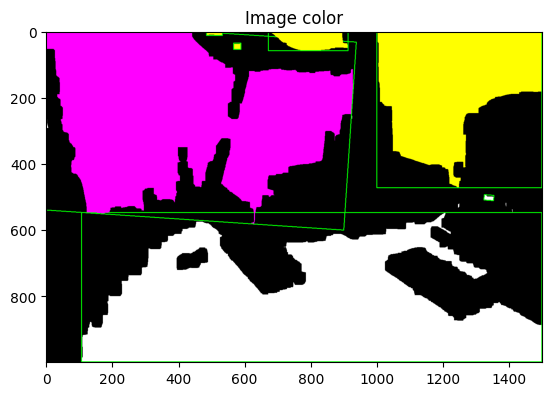

In [42]:
im_rec = cv2.cvtColor(sure_bg.copy(), cv2.COLOR_GRAY2BGR)

h, w = sure_bg.shape[:2]
image_area = h * w

bottom_mask = np.zeros((h, w), dtype=np.uint8)
bottom_mask[h // 2:, :] = 255

for contour in largest_4:
    area = cv2.contourArea(contour)
    if area < 100:
        continue

    # mask for this contour
    cnt_mask = np.zeros((h, w), dtype=np.uint8)
    cv2.drawContours(cnt_mask, [contour], -1, 255, -1)

    # intersection with bottom half
    intersection = cv2.bitwise_and(cnt_mask, bottom_mask)
    area_bottom = cv2.countNonZero(intersection)

    # min area rect
    rect = cv2.minAreaRect(contour)
    box = cv2.boxPoints(rect).astype(int)
    (center, (rw, rh), angle) = rect

    # normalize angle (long side)
    if rw < rh:
        angle += 90

    epsilon = 40

    if area_bottom / area < 0.5:
        print("half top here :|")
        cv2.drawContours(mask,[contour],0,0,-1)
        cv2.drawContours(im_rec, [contour], 0, (255, 0, 255), -1)

    if abs(angle) < epsilon:
        print("Rectangle horizontal (côté long parallèle à x-axis)")
        cv2.drawContours(im_rec, [box], 0, (0, 255, 0), 2)

    elif abs(angle - 90) < epsilon:
        print("Rectangle vertical (côté long parallèle à y-axis)")
        cv2.drawContours(im_rec, [contour], 0, (0, 255, 255), -1)

    elif abs(angle - 180) < epsilon:
        print("Rectangle vertical (côté long parallèle à y-axis 2)")
        if area < image_area / 2:
            cv2.drawContours(im_rec, [contour], 0, (0, 255, 255), -1)

    else:
        print(f"Rectangle incliné, angle ≈ {angle:.1f}°")
        if area < image_area / 2:
            cv2.drawContours(im_rec, [contour], 0, (255, 0, 0), -1)
    cv2.drawContours(im_rec, [box], 0, (0, 255, 0), 2)
show_image_rgb(im_rec)

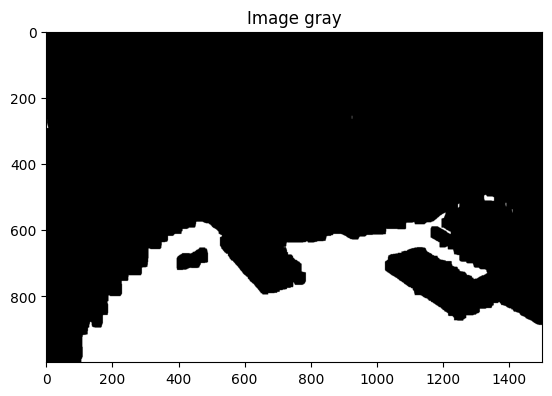

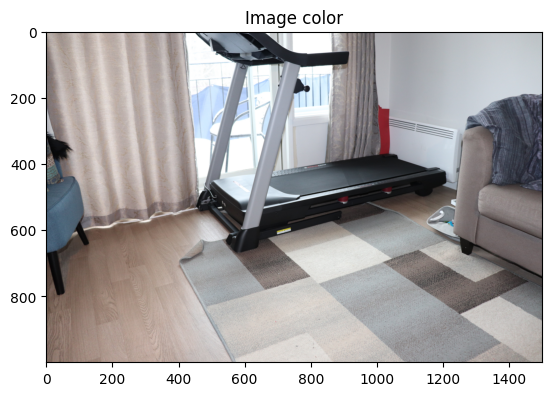

In [44]:
show_image_wb(mask)
show_image_rgb(image_de_reference)